# Siniestralidad

**DATABASE:** Siniestralidad
<p>The Siniestralidad database groups a geojson and a spreadsheet files, which contain 4 sheets: “”siniestros”, “actor_vial”, “vehiculos”, ”hipotesis” and consist of the information shown below:</p>

1.  Attribute file
The attribute of the geojson file has the following information:

<p>Object_id:</p> 
<li>   index</li></p>
<li>	Formulario: Form number</li>
<li>	Codigo_accidente: Accident code</li>
<li>	Anno_ocurrecia_acc: Year</li>
<li>	Direccion: Address</li>
<li>	Gravedad: Severity</li>
<li>	Clase_acc: Type of accident</li>
<li>	Localidad: Borough</li>
<li>	Fecha_hora_acc: Date and time.</li>
<li>	Geometry: location</li>
            


The attribute of the Excel file has the following information:

<p><b>Siniestros:</b></p>
<p></p>
<li>    Codigo_siniestro: Accident code</li>
<li>	Fecha: Date</li>
<li>	Hora: Time</li>
<li>	Gravedad: Severity</li>
<li>	Clase: Type of accident</li>
<li>	Choque_con: Impact against</li>
<li>	Direccion: Address</li>
<li>	Total_muertos: Total of deaths</li>
<li>	Total_heridos: Total of injured</li>
<li>	Localidad: Borough</li>
<li>	Diseno_lugar: Road<l/i><p>



<p><b>Actor_vial:</b></p>
<p></p>
<li>	Codigo_siniestro: Accident code</li>
<li>	Fecha: Date</li>
<li>    Condicion: Involved</li>
<li>	Estado: Condition</li>
<li>	Edad: Age</li>
<li>	Sexo: Gender</li>
<li>	Vehiculo: Vehicle code</li>


<p><b>Vehiculos:</b></p>
<p></p>
<li>	Codigo_siniestro: Accident code</li>
<li>	Fecha: Date	Vehiculo: Vehicle code</li>
<li>	Clase: Typeof vehicle</li>
<li>	Servicio: Type of service</li>
<li>	Enfuga: Fleeing</li>


<p><b>Hipotesis:</b></p>
<p></p>
<li>	Codigo_siniestro: Accident code</li>
<li>	Fecha: Date</li>
<li>	Codigo_causa: Description code</li>
<li>	Codigo_causa2: Description code</li>


In [ ]:
!pip install

In [1]:
import pandas as pd
import numpy as np
import json
import folium
import fiona
import geopandas as gpd
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
import seaborn as sns
from folium import plugins
import warnings
warnings.filterwarnings("ignore")
sns.set(style='whitegrid')
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(13.7,10.27)})

ModuleNotFoundError: ignored

In [ ]:
meses   = ('Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 
          'Julio', 'Agosto', 'Septiembre', 'Octubre','Nobiembre', 'Diciembre')

In [ ]:
%%time
#siniestros = pd.read_csv('siniestros.csv', index_col=0)
actor_vial = pd.read_csv('actor_vial.csv') 
#hipotesis = pd.read_csv('hipotesis_sin_repeticion.csv')
#vehiculo = pd.read_csv('vehiculo.csv')
#geo_siniestros = gpd.read_file('.\Data\Siniestros viales\Historico.geojson')

Wall time: 1.07 s


In [ ]:
no_geolocation = siniestros[~siniestros['CODIGO_SINIESTRO'].isin(geo_siniestros['CODIGO_ACCIDENTE'])]

In [ ]:
no_geolocation.to_csv('no_geolocalizados.csv')

In [ ]:
display(siniestros.head(5))
display(actor_vial.head(20))
display(hipotesis.head(2))
display(vehiculo.head(2))
display(geo_siniestros.head(5))
len(actor_vial)

,CODIGO_SINIESTRO,FEMENINO,MASCULINO,SIN INFORMACION,PEATON_FALLECIDO,PEATON_HERIDO,PASAJERO_FALLECIDO,PASAJERO_HERIDO,CONDUCTOR_FALLECIDO,CONDUCTOR_HERIDO,CICLISTA_FALLECIDO,CICLISTA_HERIDO,MOTOCICLISTA_FALLECIDO,MOTOCICLISTA_HERIDO,ILESOS
0,4401419,1,1,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,4401420,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
2,4401421,1,2,0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,4401422,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,4401423,1,1,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,4401424,0,2,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6,4401425,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
7,4401426,0,3,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
8,4401427,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
9,4401428,2,2,0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


173306

In [ ]:
siniestros['FECHA'] = pd.to_datetime(siniestros['FECHA'])

<AxesSubplot:xlabel='FECHA'>

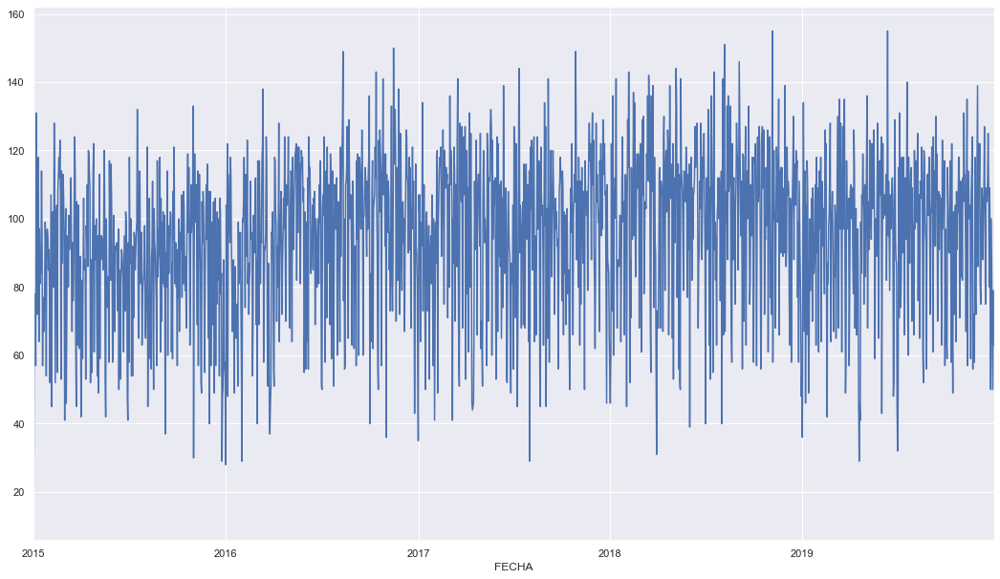

In [ ]:
sns.set(rc={'figure.figsize':(18,10.27)})
from pandas import Grouper
siniestros.groupby('FECHA')['FECHA'].count().plot()

**Comment:** Creating columns "lon" and "lat" (longitud and latitud)

In [ ]:
geo_siniestros['lon'] = geo_siniestros.geometry.apply(lambda p: p.x)
geo_siniestros['lat'] = geo_siniestros.geometry.apply(lambda p: p.y)

In [ ]:
geo_siniestros.rename(columns={"CODIGO_ACCIDENTE":"CODIGO_SINIESTRO"}, inplace=True)

<b>Comment :</b>First, a global analysis of the data obtained will be made: The geojson file contains data from 2007 to 2019, while the spreadsheet file contains data from 2015 to 2019, therefore, to make a Proper crossing of information between both files will only be used for the initial global study the period between 2015 and 2019 and was carried out as described below:

In [ ]:
geo_siniestros_2015_2019 = geo_siniestros[(
    geo_siniestros['ANO_OCURRENCIA_ACC']>=2015) & (geo_siniestros['ANO_OCURRENCIA_ACC']<=2019)]

**Comment:** Checking dataframes

In [ ]:
df = pd.merge(siniestros, geo_siniestros_2015_2019[['CODIGO_SINIESTRO', 'lon', 'lat']], how='left')

In [ ]:
df =  pd.merge(df, actor_vial[['CODIGO_SINIESTRO', 'ILESOS']], how='left')

In [ ]:
df['Hora'] = pd.to_datetime(df['HORA']).dt.hour

df['Dia']=pd.to_datetime(df['FECHA']).dt.weekday

df['Mes']=pd.to_datetime(df['FECHA']).dt.month


In [ ]:
df =  pd.merge(df, hipotesis , how='left')

In [ ]:
df.to_csv('siniestros_con_hipotesis.csv')

**Comment:** Adjusting the dataframe siniestralidad_vehiculos

In [ ]:
z=pd.DataFrame(siniestralidad_vehiculos.groupby(
    ('CODIGO_SINIESTRO','CLASE'))['CLASE'].count().reset_index(name='CLASE_COUNT'))
x=pd.DataFrame(siniestralidad_vehiculos.groupby(
    ('CODIGO_SINIESTRO','SERVICIO'))['SERVICIO'].count().reset_index(name='SERVICIO_COUNT'))

z=z.pivot_table(
    index='CODIGO_SINIESTRO', columns='CLASE', values='CLASE_COUNT', fill_value = 0).reset_index()
x=x.pivot_table(
    index='CODIGO_SINIESTRO', columns='SERVICIO', values='SERVICIO_COUNT', fill_value = 0).reset_index()

siniestralidad_vehiculos_fx = pd.merge(x, z, how='inner', left_on='CODIGO_SINIESTRO', right_on='CODIGO_SINIESTRO')

In [ ]:
siniestralidad_geo_1 = pd.merge(
    siniestralidad_geo, 
    siniestralidad_1[['CODIGO_SINIESTRO', 
                      'OBJETO_FIJO',                                           
                      'TOTAL_MUERTOS', 
                      'TOTAL_HERIDOS',
                      'DISENO_LUGAR',
                      'HORA']], 
                       how = 'inner', 
                       left_on = 'CODIGO_ACCIDENTE', 
                       right_on = 'CODIGO_SINIESTRO')

In [ ]:
siniestralidad_geo_1_hipotesis = pd.merge(
    siniestralidad_geo_1,
    siniestralidad_hipotesis[['CODIGO_SINIESTRO',
                              'CODIGO_CAUSA',
                              'DESCRIPCION',
                              'CODIGO_CAUSA2',
                              'DESCRIPCION2']],
                              how = 'inner',
                              left_on = 'CODIGO_ACCIDENTE', 
                              right_on = 'CODIGO_SINIESTRO')

In [ ]:
siniestralidad_geo_1_hipotesis_vehiculo = pd.merge(
    siniestralidad_geo_1_hipotesis,
    siniestralidad_vehiculos_fx,
                              how = 'inner',
                              left_on = 'CODIGO_ACCIDENTE', 
                              right_on = 'CODIGO_SINIESTRO')

In [ ]:
del siniestralidad_geo_1_hipotesis_vehiculo['CODIGO_SINIESTRO_y']
del siniestralidad_geo_1_hipotesis_vehiculo['CODIGO_SINIESTRO_x']
del siniestralidad_geo_1_hipotesis_vehiculo['CODIGO_SINIESTRO']

In [ ]:
siniestralidad_vehiculos = pd.read_excel(r'.\Data\Siniestros viales\2015_2019_siniestralidad_vial.xlsx','VEHICULOS') 

In [ ]:
siniestralidad_geo_1_hipotesis_vehiculo['TOTAL_VICTIMAS'] = (
    siniestralidad_geo_1_hipotesis_vehiculo['TOTAL_MUERTOS'] + 
    siniestralidad_geo_1_hipotesis_vehiculo['TOTAL_HERIDOS'])

df = siniestralidad_geo_1_hipotesis_vehiculo.copy()

df['HOUR'] = pd.to_datetime(df['FECHA_HORA_ACC']).dt.hour

df['DAY']=pd.to_datetime(df['FECHA_HORA_ACC']).dt.weekday

df['MONTH']=pd.to_datetime(df['FECHA_HORA_ACC']).dt.month

df['CODIGO_CAUSA'] = df['CODIGO_CAUSA'].astype(str)
df['CODIGO_CAUSA'] = df['CODIGO_CAUSA'].str.replace('ANT-','99').astype(float)

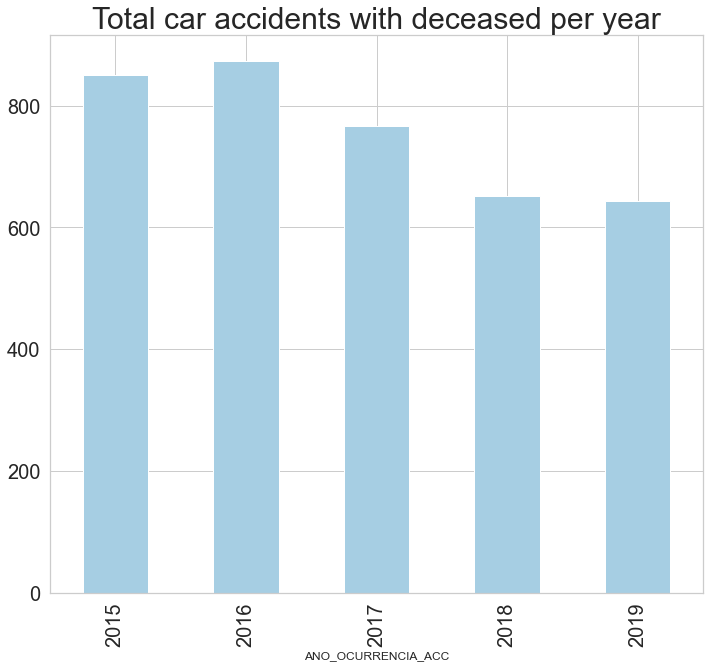

In [ ]:
ax = df.groupby('ANO_OCURRENCIA_ACC')['TOTAL_MUERTOS'].sum()
ax.plot(kind='bar', colormap='Paired', fontsize=20)
plt.title('Total car accidents with deceased per year', fontsize=30)
plt.savefig("Total_fallecidos_2015_2019.png");

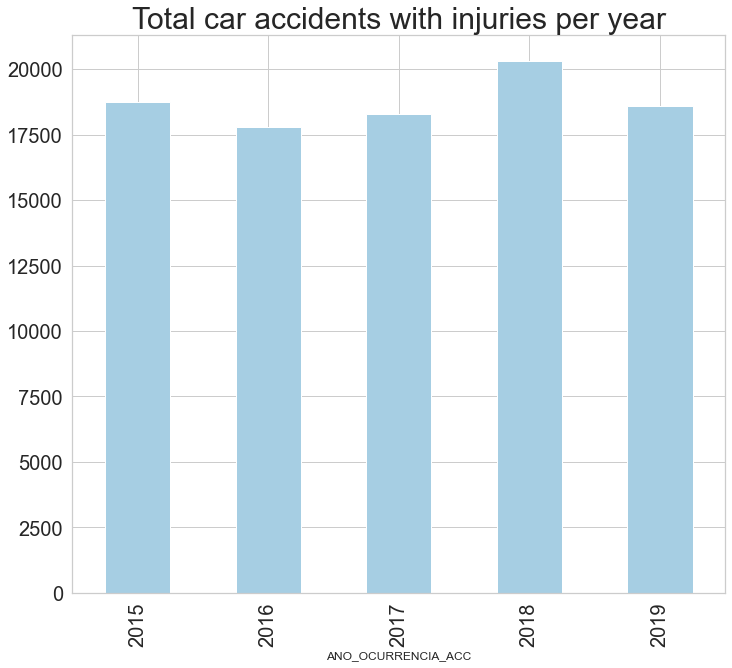

In [ ]:
ax = df.groupby('ANO_OCURRENCIA_ACC')['TOTAL_HERIDOS'].sum()
ax.plot(kind='bar', colormap='Paired', fontsize=20)
plt.title('Total car accidents with injuries per year', fontsize=30)
plt.savefig("Total_heridos_2015_2019.png");

In [ ]:
df['ANO_OCURRENCIA_ACC'].value_counts()

2016    40350
2017    40327
2018    38080
2015    36947
2019    34157
Name: ANO_OCURRENCIA_ACC, dtype: int64

In [ ]:
df[df['GRAVEDAD']=='CON MUERTOS']['ANO_OCURRENCIA_ACC'].value_counts()

2016    840
2015    830
2017    767
2018    634
2019    624
Name: ANO_OCURRENCIA_ACC, dtype: int64

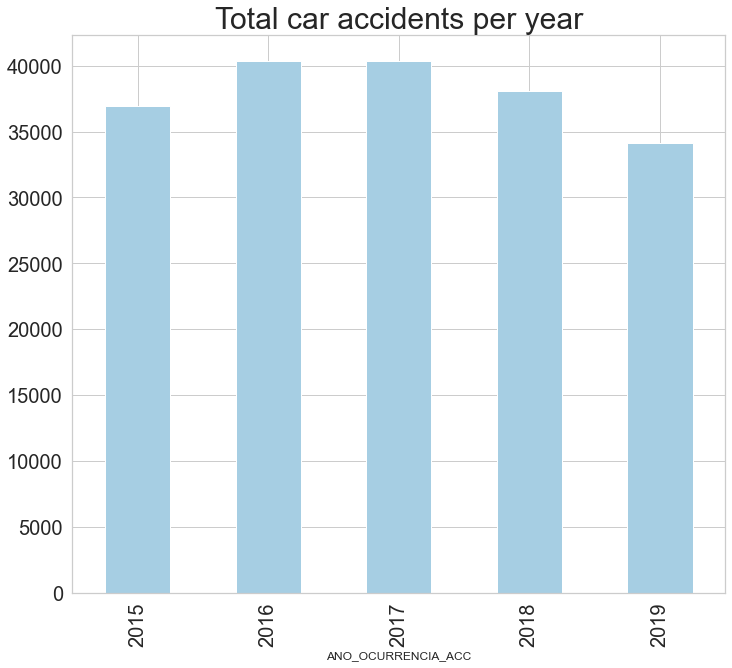

In [ ]:
ax = df.groupby('ANO_OCURRENCIA_ACC')['TOTAL_HERIDOS'].count()
ax.plot(kind='bar', colormap='Paired', fontsize=20)
plt.title('Total car accidents per year', fontsize=30)
plt.savefig("Total_accidentes_2015_2019.png");

In [ ]:
df['CLASE_ACC'].value_counts()

CHOQUE               160760
ATROPELLO             21038
CAIDA DE OCUPANTE      4932
VOLCAMIENTO            2224
OTRO                    869
INCENDIO                 23
AUTOLESION               15
Name: CLASE_ACC, dtype: int64

In [ ]:
pd.DataFrame(df.groupby('ANO_OCURRENCIA_ACC')['CLASE_ACC'].value_counts())

CLASE_ACC
ANO_OCURRENCIA_ACC CLASE_ACC                   
2015               CHOQUE                 30521
                   ATROPELLO               4894
                   CAIDA DE OCUPANTE       1000
                   VOLCAMIENTO              330
                   OTRO                     195
                   AUTOLESION                 5
                   INCENDIO                   2
2016               CHOQUE                 34374
                   ATROPELLO               4484
                   CAIDA DE OCUPANTE       1004
                   VOLCAMIENTO              369
                   OTRO                     113
                   AUTOLESION                 4
                   INCENDIO                   2
2017               CHOQUE                 34363
                   ATROPELLO               4293
                   CAIDA DE OCUPANTE       1014
                   VOLCAMIENTO              434
                   OTRO                     214
                   AUTOLESION                 6
                   INCENDIO                   3
2018               CHOQUE                 32493
                   ATROPELLO               3894
                   CAIDA DE OCUPANTE        998
                   VOLCAMIENTO              531
                   OTRO                     157
                   INCENDIO                   7
2019               CHOQUE                 29009
                   ATROPELLO               3473
                   CAIDA DE OCUPANTE        916
                   VOLCAMIENTO              560
                   OTRO                     190
                   INCENDIO                   9

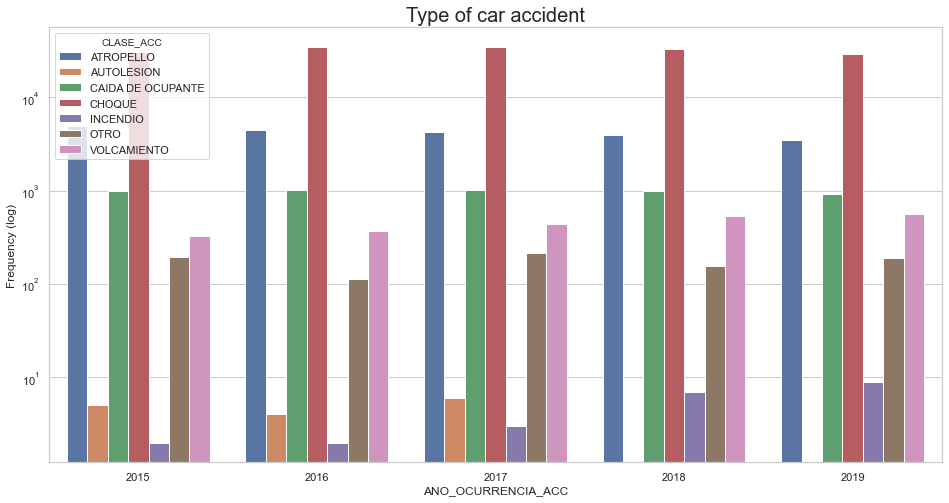

In [ ]:
plt.figure(figsize = (16,8))
gp = df.groupby((
    'ANO_OCURRENCIA_ACC','CLASE_ACC'))['CODIGO_ACCIDENTE'].count().reset_index()
gp = pd.DataFrame(gp)
ax = sns.barplot(x='ANO_OCURRENCIA_ACC', y='CODIGO_ACCIDENTE', hue='CLASE_ACC', data=gp)
plt.title('Type of car accident', fontsize=20)
ax.set(yscale="log",  ylabel = "Frequency (log)");
plt.savefig("clase_de_siniestro_2015_2019.png");

**Comment :** As can be seen in the figures and in the table, the highest number of occurrences of in the column " CLASE_ACC" is " CHOQUE " followed by a distance by " ATROPELLO " and "“CAIDA DE OCUPANTE ", then in the plot¨ and in the The table shows the sum of the different values of the column, noting that the causes " VOLCAMIENTO " and " INCENDIO " have increased in the period studied while " AUTOLESION " did not count the last 2 years.

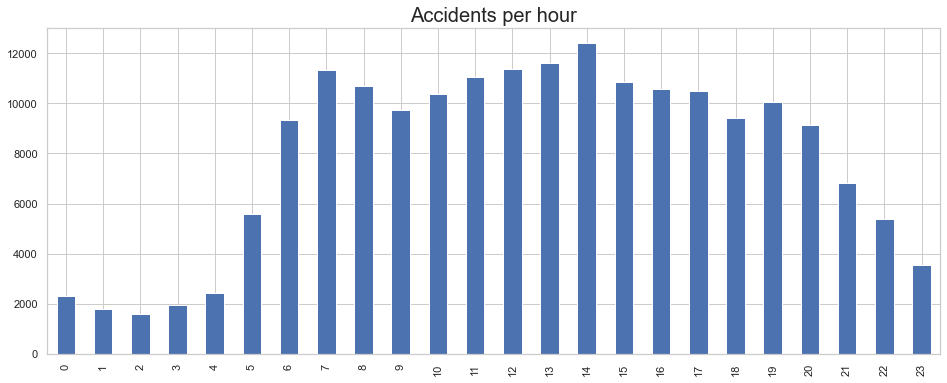

In [ ]:
df['HOUR'].value_counts().sort_index().plot(
    kind="bar", figsize = (16, 6))
plt.title('Accidents per hour', fontsize=20)
plt.savefig('accidents_per_hour.png')

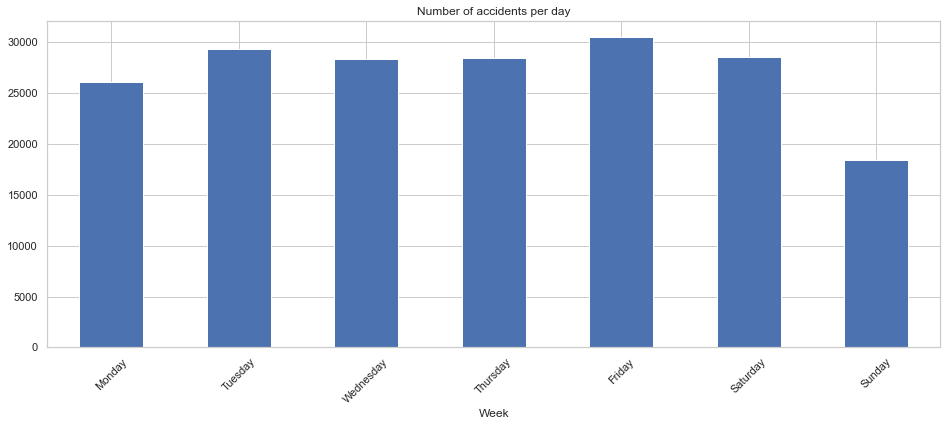

In [ ]:
week   = ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday')
b=df['DAY'].value_counts().sort_index()
b.index=week
plt.xlabel('Week')
b.plot(kind="bar",title='Number of accidents per day',figsize = (16, 6))
plt.xticks(rotation=45);
plt.savefig('accidents_per_day.png')

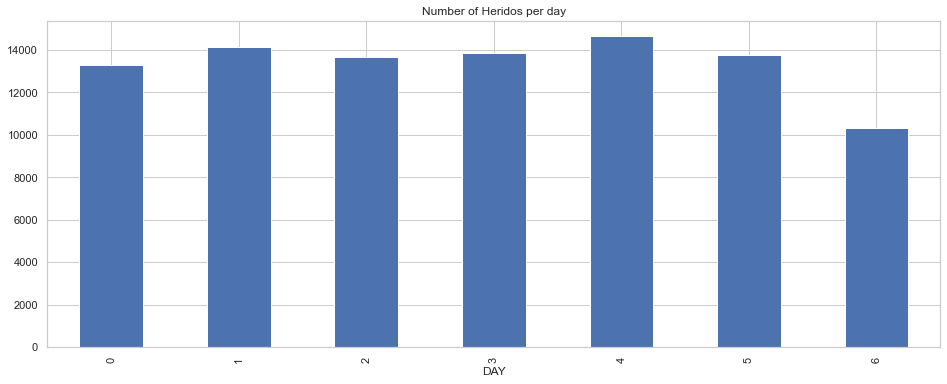

In [ ]:
df.groupby('DAY')['TOTAL_HERIDOS'].sum().plot(
    kind="bar",title='Number of Heridos per day',figsize = (16, 6));

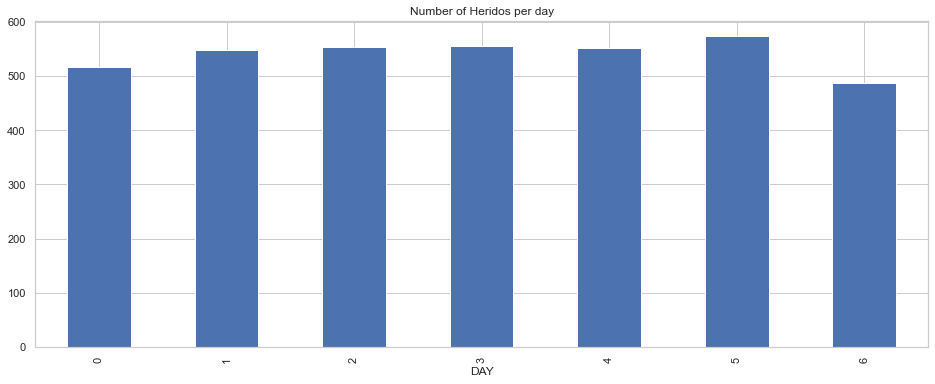

In [ ]:
plt.xlabel('week')
df.groupby('DAY')['TOTAL_MUERTOS'].sum().plot(
    kind="bar",title='Number of deaths per day',figsize = (16, 6));

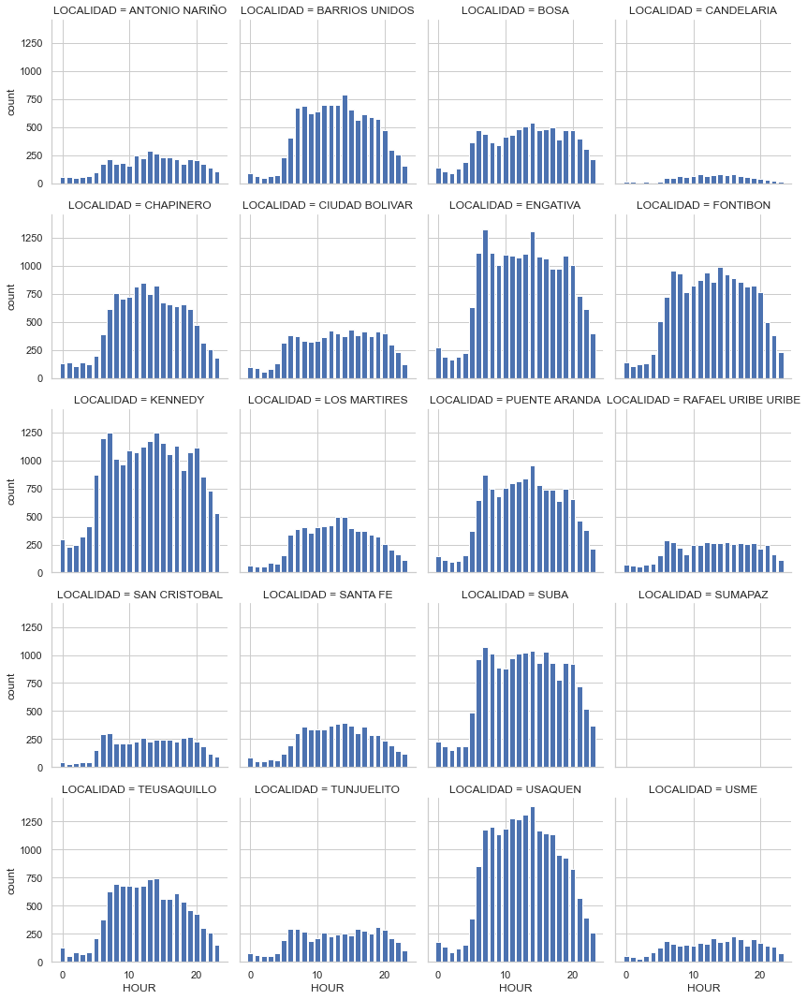

In [ ]:
z=df.groupby('LOCALIDAD')['HOUR'].value_counts().reset_index(name='count')
g = sns.FacetGrid(z,col='LOCALIDAD', col_wrap=4)
plt.title('Accidents per hour per borough', fontsize=20)
plt.savefig('accidents_per_hour_perborough.png')
g.map(plt.bar,"HOUR","count");

**Comment :** In the plot above it can be seen the peaks in the number of accidents highlighted with a red circle, these are at 7:00 but that begins with an upward trend at 4:00, the other peak is at 14: 00, starting its uptrend at 10:00. The figure below shows a breakdown of the accidents that occurred in the period studied by location. Those with the highest peaks are the locations of “USAQUEN” and “PUENTE ARANDA”, while the lowest are of “USME” and “ FONTIBON "

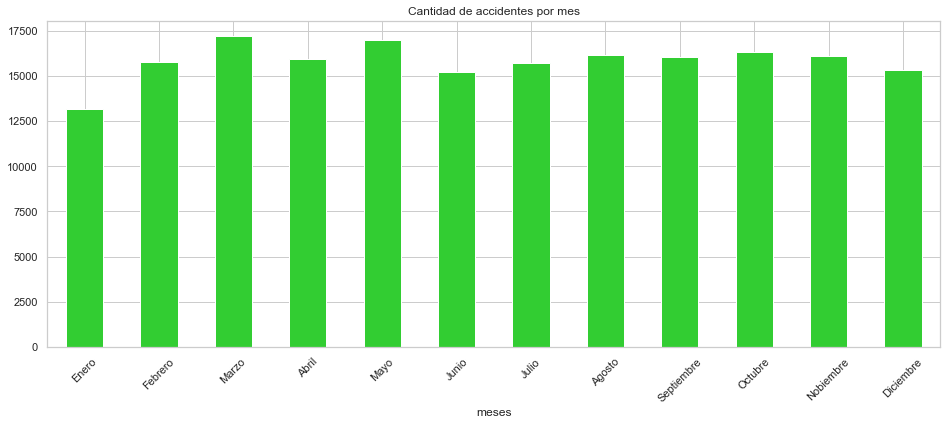

In [ ]:
b=df['MONTH'].value_counts().sort_index()
b.index=meses
plt.xlabel('meses')
b.plot(kind="bar",title='Cantidad de accidentes por mes',figsize = (16, 6), color='limegreen')
plt.xticks(rotation=45);

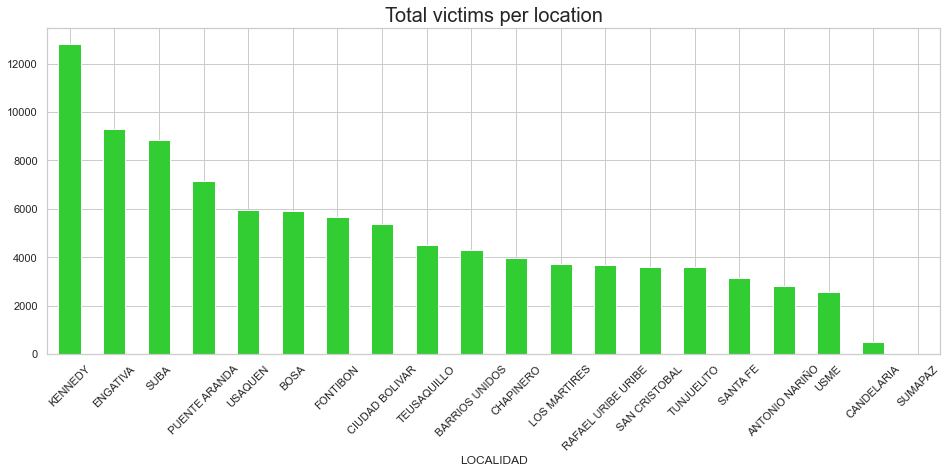

In [ ]:
df.groupby('LOCALIDAD')['TOTAL_VICTIMAS'].sum().sort_values(
    ascending=False).plot(kind='bar', figsize=(16,6), color='limegreen');
plt.title('Total victims per location', fontsize=20)
plt.xticks(rotation=45);
plt.savefig('victimas_por_locacion.png')


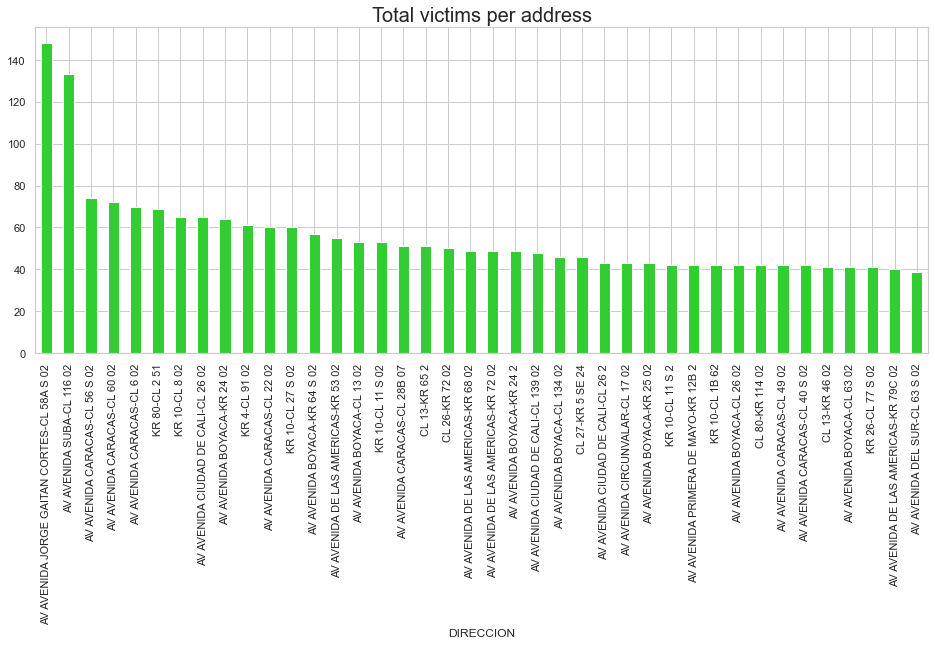

In [ ]:
df.groupby('DIRECCION')['TOTAL_VICTIMAS'].sum().sort_values(ascending=False).head(40).plot(
    kind="bar",figsize = (16, 6), color='limegreen')
plt.title('Total victims per address', fontsize=20);

**COmment :** In the top 5 of the locations with most traffic accidents are: "KENEDY", "ENGATIVA", "SUBA", "PUENTE ARANDA" and "USAQUEN", while the top 5 of the addresses with most accidents in the period 2015-2019 are "AVENIDA JORGE GAITAN CORTES-CL 58ª", "AVENIDA SUBA-CL 116", "AVENIDA CARACAS-CL 56", "AVENIDA CARACAS-CL 60", "AVENIDA CARACAS-CL 6", making it clear that "AVENIDA CARACAS" is in 4 of the first 5, then we will see in the analysis of 2019 if this has changed.

In [ ]:
df.groupby('DIRECCION')['TOTAL_VICTIMAS'].sum().sort_values(ascending=False).head(5)

DIRECCION
AV AVENIDA JORGE GAITAN CORTES-CL 58A S 02    148
AV AVENIDA SUBA-CL 116 02                     133
AV AVENIDA CARACAS-CL 56 S 02                  74
AV AVENIDA CARACAS-CL 60 02                    72
AV AVENIDA CARACAS-CL 6 02                     70
Name: TOTAL_VICTIMAS, dtype: int64

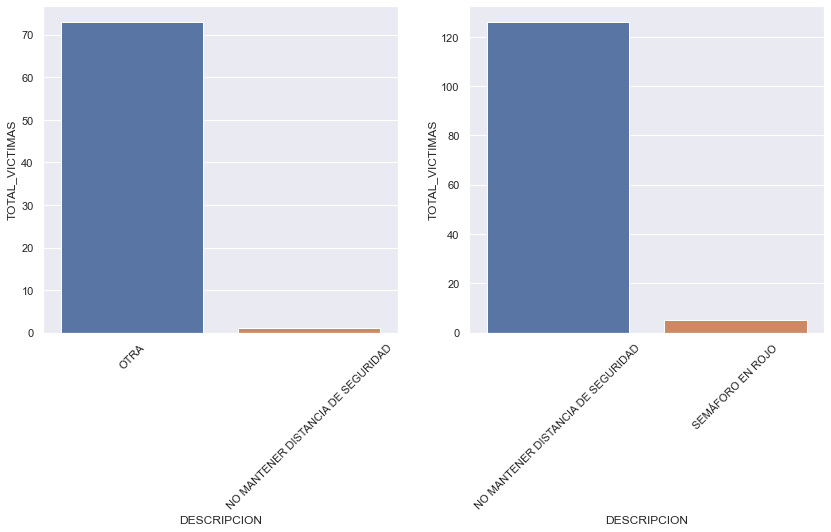

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14,6))

gp = df[df['DIRECCION']=='AV AVENIDA JORGE GAITAN CORTES-CL 58A S 02'].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp = pd.DataFrame(gp)
gp = gp.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax1=sns.barplot(x=gp.index, y='TOTAL_VICTIMAS', data=gp, ax=axes[0])

gp = df[df['DIRECCION']=='AV AVENIDA SUBA-CL 116 02'].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp = pd.DataFrame(gp)
gp = gp.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax2 = sns.barplot(x=gp.index, y='TOTAL_VICTIMAS', data=gp, ax=axes[1]);


ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45);


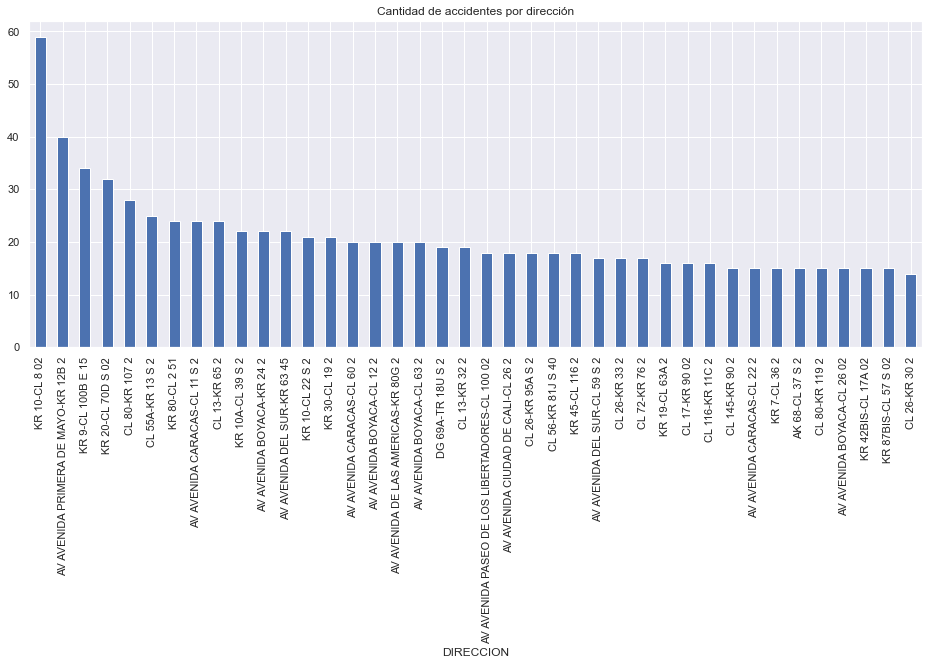

In [ ]:
df[df['ANO_OCURRENCIA_ACC']==2019].groupby('DIRECCION')['TOTAL_VICTIMAS'].sum().sort_values(ascending=False).head(40).plot(
    kind="bar",title='Cantidad de accidentes por dirección',figsize = (16, 6));

In [ ]:
df[df['ANO_OCURRENCIA_ACC']==2019].groupby('DIRECCION')['TOTAL_VICTIMAS'].sum().sort_values(ascending=False).head(5)

DIRECCION
KR 10-CL 8 02                          59
AV AVENIDA PRIMERA DE MAYO-KR 12B 2    40
KR 9-CL 100B E 15                      34
KR 20-CL 70D S 02                      32
CL 80-KR 107 2                         28
Name: TOTAL_VICTIMAS, dtype: int64

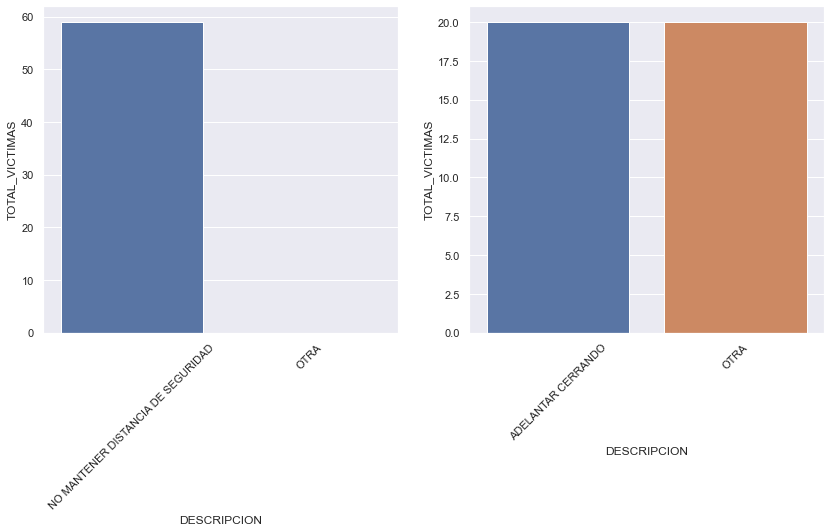

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14,6))

gp1 = df[(df['DIRECCION']=='KR 10-CL 8 02') & 
        (df['ANO_OCURRENCIA_ACC']==2019)].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp1 = pd.DataFrame(gp1)
gp1 = gp1.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax1=sns.barplot(x=gp1.index, y='TOTAL_VICTIMAS', data=gp1, ax=axes[0])

gp = df[(df['DIRECCION']=='AV AVENIDA PRIMERA DE MAYO-KR 12B 2') & 
        (df['ANO_OCURRENCIA_ACC']==2019)].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp = pd.DataFrame(gp)
gp = gp.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax2 = sns.barplot(x=gp.index, y='TOTAL_VICTIMAS', data=gp, ax=axes[1]);


ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45);


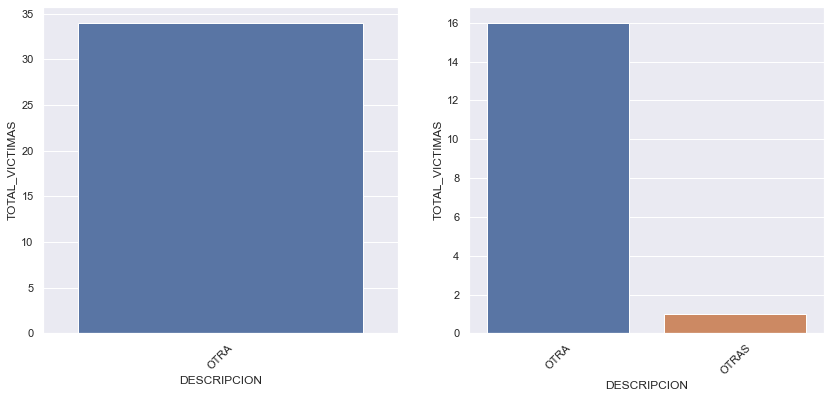

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14,6))

gp1 = df[(df['DIRECCION']=='KR 9-CL 100B E 15') & 
        (df['ANO_OCURRENCIA_ACC']==2019)].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp1 = pd.DataFrame(gp1)
gp1 = gp1.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax1=sns.barplot(x=gp1.index, y='TOTAL_VICTIMAS', data=gp1, ax=axes[0])

gp = df[(df['DIRECCION']=='KR 20-CL 70D S 02') & 
        (df['ANO_OCURRENCIA_ACC']==2019)].groupby('DESCRIPCION')['TOTAL_VICTIMAS'].sum()
gp = pd.DataFrame(gp)
gp = gp.sort_values(by='TOTAL_VICTIMAS', ascending=False).head(2)
ax2 = sns.barplot(x=gp.index, y='TOTAL_VICTIMAS', data=gp, ax=axes[1]);


ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45);


<AxesSubplot:ylabel='TOTAL_MUERTOS'>

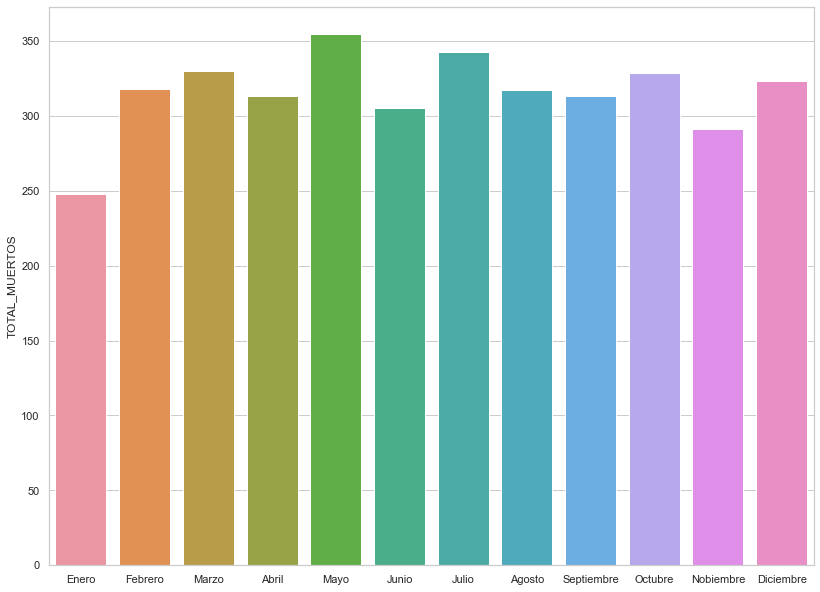

In [ ]:
gp = df.groupby('MONTH')['TOTAL_MUERTOS'].sum()
gp.index=meses
gp = pd.DataFrame(gp)
sns.barplot(x=gp.index, y='TOTAL_MUERTOS',data=gp)

<AxesSubplot:ylabel='TOTAL_HERIDOS'>

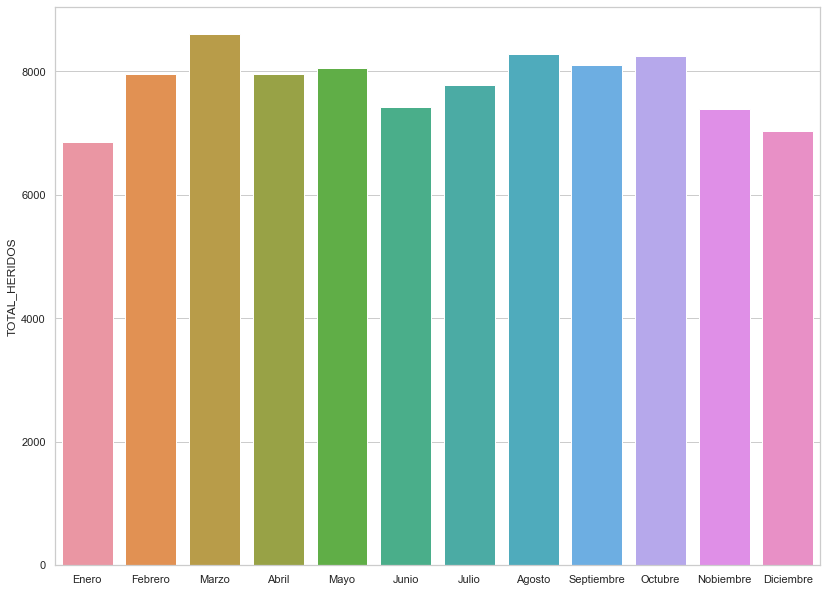

In [ ]:
gp = df.groupby('MONTH')['TOTAL_HERIDOS'].sum()
gp.index=meses
gp = pd.DataFrame(gp)
sns.barplot(x=gp.index, y='TOTAL_HERIDOS',data=gp)

In [ ]:
descripcion_fallecidos = df[df['TOTAL_MUERTOS']>0].copy()

In [ ]:
descripcion_fallecidos2 = pd.concat([
    descripcion_fallecidos['DESCRIPCION'],
    descripcion_fallecidos['DESCRIPCION2'],
    descripcion_fallecidos['DESCRIPCION3'],
    descripcion_fallecidos['DESCRIPCION4']
])

descripcion_fallecidos2=descripcion_fallecidos2.reset_index()
p=pd.DataFrame(descripcion_fallecidos2.groupby('index')[0].value_counts().reset_index(name='count_rows'))

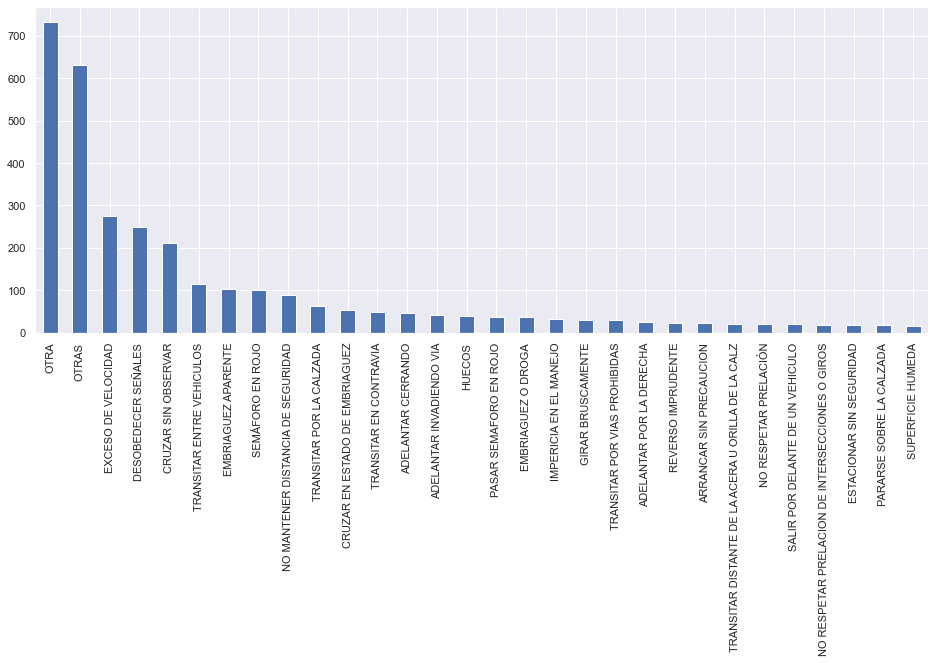

In [ ]:
p[0].value_counts().head(30).plot(kind='bar',figsize=(16,6))
plt.xticks(rotation=90);

**Comment :** As main hypothesis 1 of fatal victims, it is striking that the generic descriptions "OTRA" and "OTRAS" appear, then " EXCESO DE VELOCIDAD ", " DESOBEDECER SEÑALES ", " CRUZAR SIN OBSERVAR " and " SEMAFORO EN ROJO ".

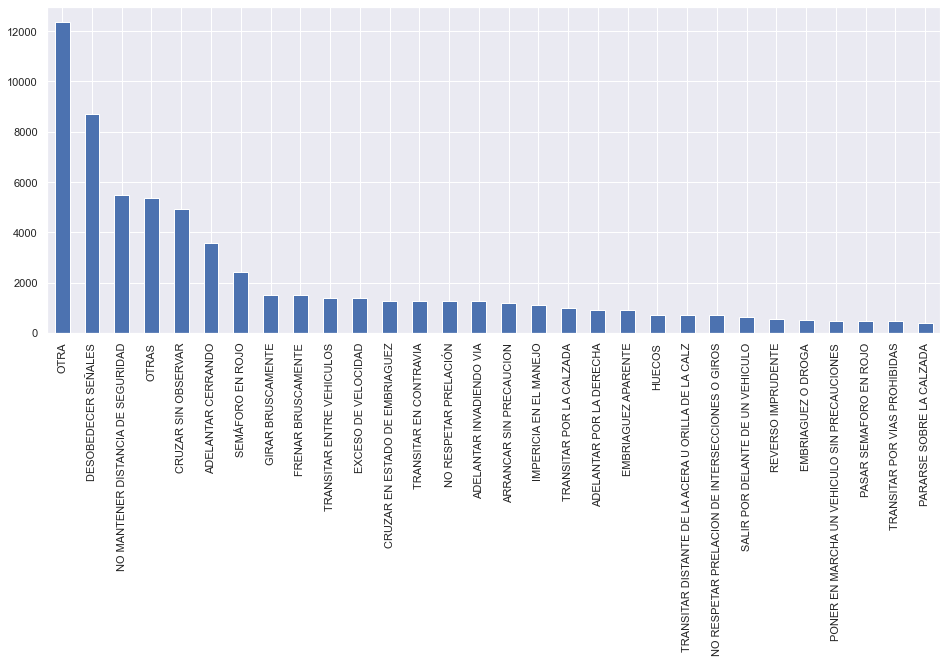

In [ ]:
descripcion_heridos = df[df['TOTAL_HERIDOS']>0].copy()
descripcion_heridos2 = pd.concat([
    descripcion_heridos['DESCRIPCION'],
    descripcion_heridos['DESCRIPCION2'],
    descripcion_heridos['DESCRIPCION3'],
    descripcion_heridos['DESCRIPCION4']
])

descripcion_heridos2 = descripcion_heridos2.reset_index()
p=pd.DataFrame(descripcion_heridos2.groupby('index')[0].value_counts().reset_index(name='count_rows'))

p[0].value_counts().head(30).plot(kind='bar',figsize=(16,6))
plt.xticks(rotation=90);

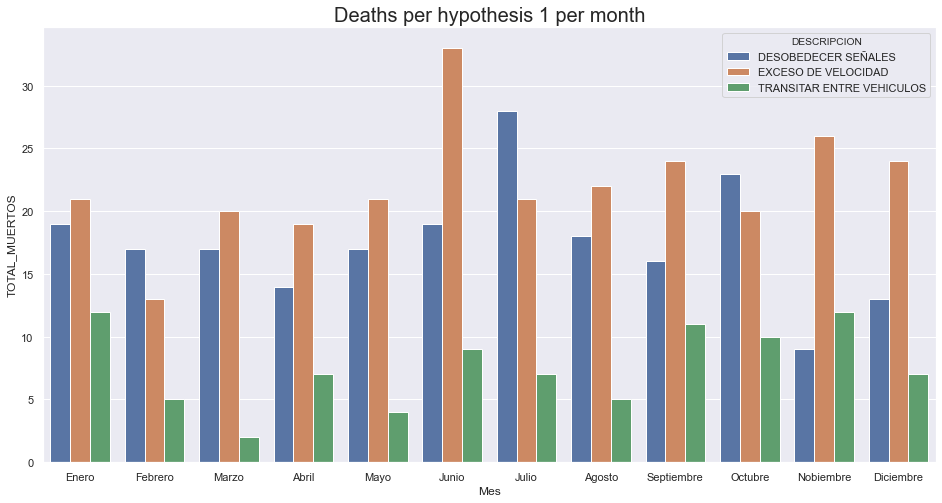

In [ ]:
plt.figure(figsize=(16,8))
conditions=(
    (df['DESCRIPCION']=='DESOBEDECER SEÑALES') | 
    (df['DESCRIPCION']=='EXCESO DE VELOCIDAD' ) |
    (df['DESCRIPCION']=='TRANSITAR ENTRE VEHICULOS'))

gp = df[conditions].groupby((
    'Mes','DESCRIPCION'))['TOTAL_MUERTOS'].sum().reset_index()
gp = pd.DataFrame(gp)
ax = sns.barplot(x='Mes', y='TOTAL_MUERTOS', hue='DESCRIPCION', data=gp)
plt.title('Deaths per hypothesis 1 per month', fontsize=20);
ax.set_xticklabels(meses);

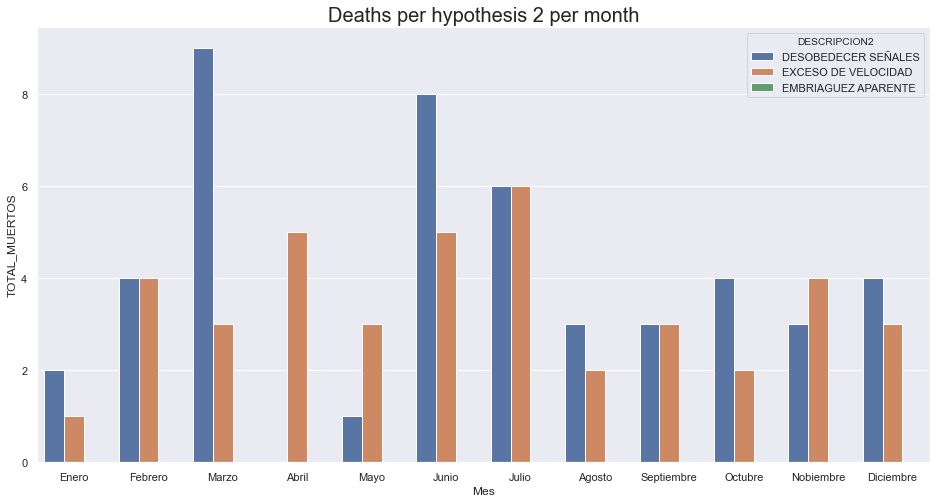

In [ ]:
plt.figure(figsize=(16,8))
conditions=(
    (df['DESCRIPCION2']=='DESOBEDECER SEÑALES') | 
    (df['DESCRIPCION2']=='EXCESO DE VELOCIDAD' ) |
    (df['DESCRIPCION2']=='EMBRIAGUEZ APARENTE'))

gp = df[conditions].groupby((
    'Mes','DESCRIPCION2'))['TOTAL_MUERTOS'].sum().reset_index()
gp = pd.DataFrame(gp)
ax = sns.barplot(x='Mes', y='TOTAL_MUERTOS', hue='DESCRIPCION2', data=gp)
plt.title('Deaths per hypothesis 2 per month', fontsize=20);
ax.set_xticklabels(meses);

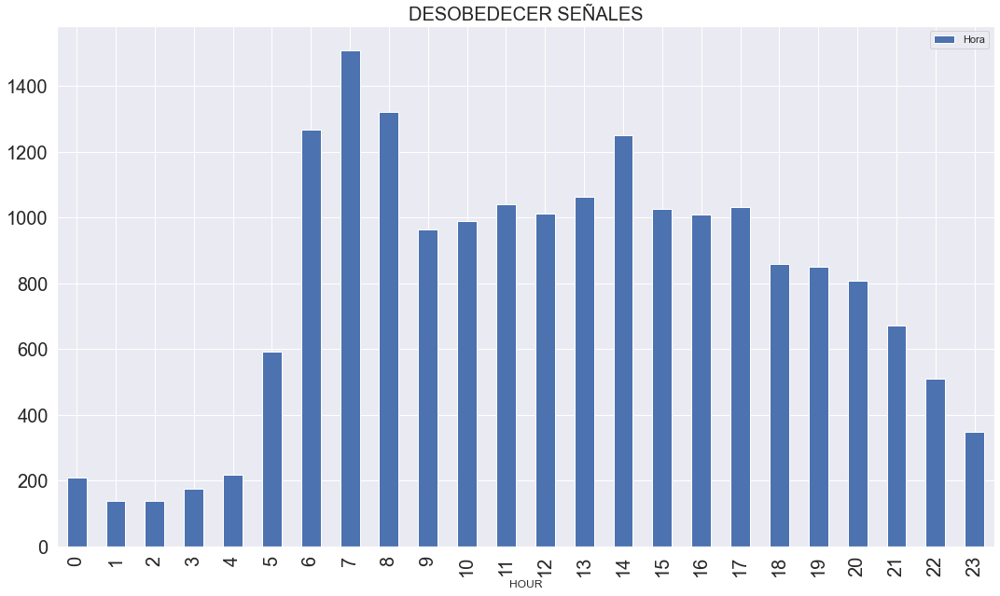

In [ ]:
gp = df[df['DESCRIPCION']=='DESOBEDECER SEÑALES']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', fontsize=20);
plt.title('DESOBEDECER SEÑALES', fontsize=20)
plt.savefig('accidents_per_hour_perborough.png')

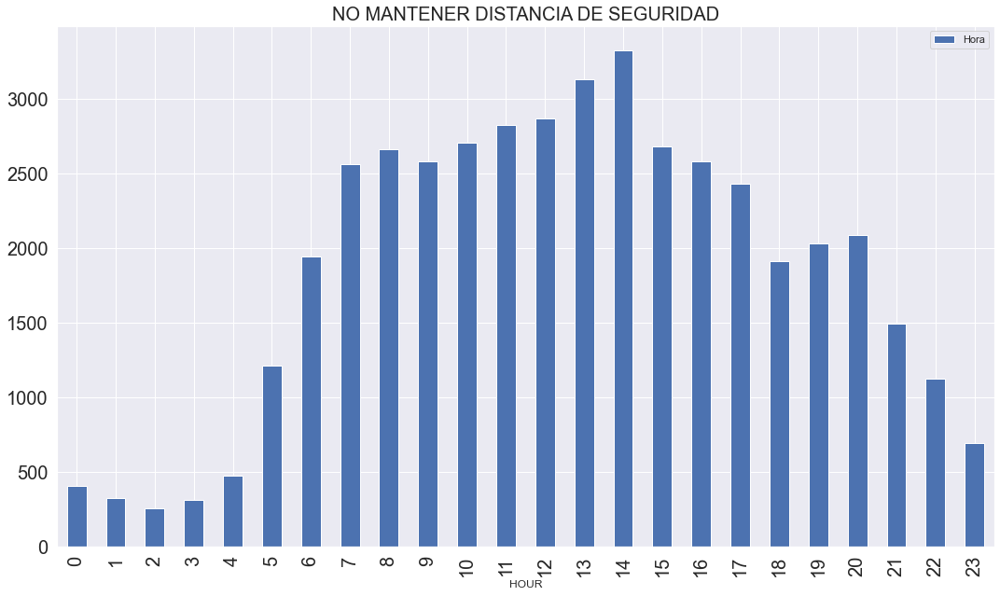

In [ ]:
gp = df[df['DESCRIPCION']=='NO MANTENER DISTANCIA DE SEGURIDAD']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', fontsize=20)
plt.title('NO MANTENER DISTANCIA DE SEGURIDAD', fontsize=20);

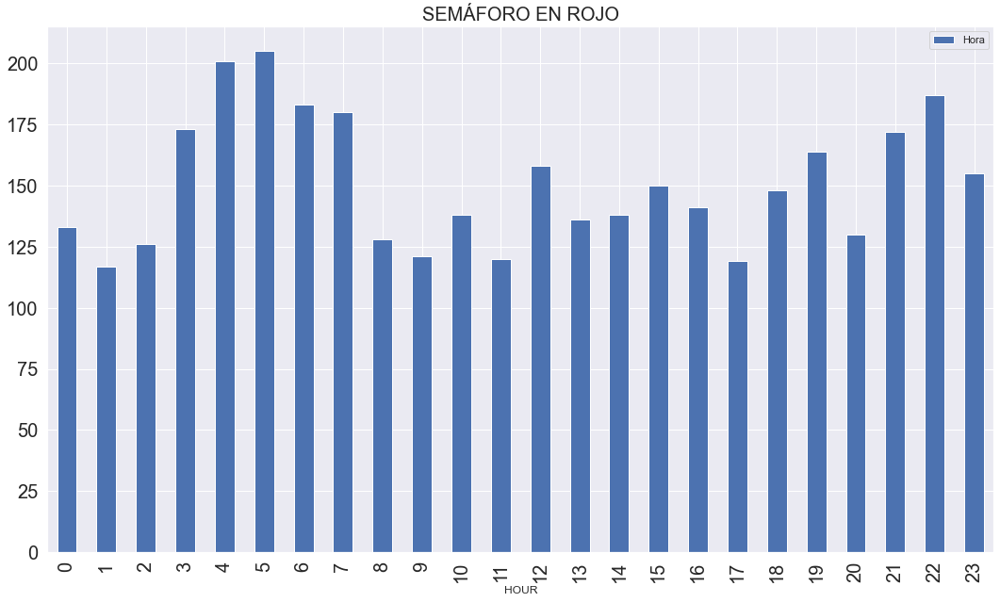

In [ ]:
gp = df[df['DESCRIPCION']=='SEMÁFORO EN ROJO']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', fontsize=20)
plt.title('SEMÁFORO EN ROJO', fontsize=20);

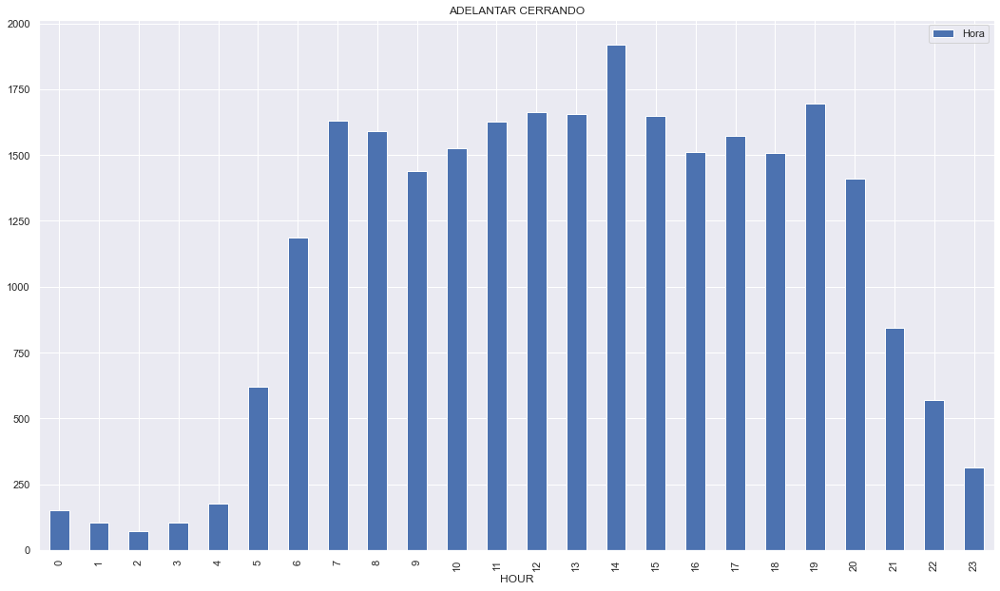

In [ ]:
gp = df[df['DESCRIPCION']=='ADELANTAR CERRANDO']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', title='ADELANTAR CERRANDO');

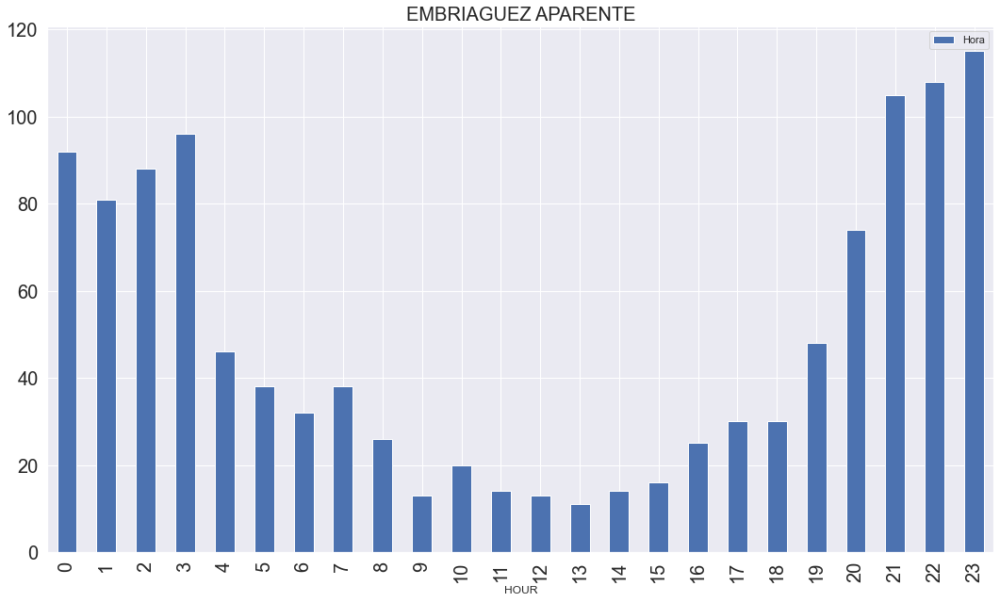

In [ ]:
gp = df[df['DESCRIPCION']=='EMBRIAGUEZ APARENTE']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', fontsize=20)
plt.title('EMBRIAGUEZ APARENTE', fontsize=20);

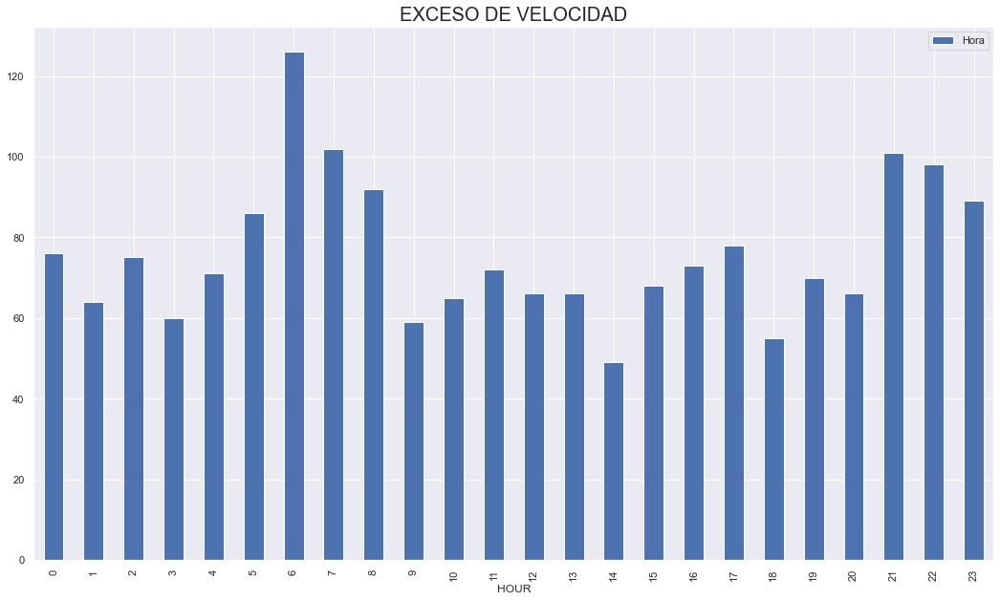

In [ ]:
gp = df[df['DESCRIPCION']=='EXCESO DE VELOCIDAD']['Hora'].value_counts().reset_index().sort_values(by='index')
gp = gp.rename(columns={'index':'HOUR','HOUR':'COUNT'})
gp.plot(x='HOUR', kind='bar', title='EXCESO DE VELOCIDAD')
plt.title('EXCESO DE VELOCIDAD', fontsize=20);

In [ ]:
df3 = pd.read_excel(r'.\Data\Siniestros viales\comparendos_dei_por-infraccion_2011-a-2019.xlsx')

In [ ]:
df3= df3.rename(columns={'AÑO_2011':2011,
                       'AÑO_2012':2012,
                       'AÑO_2013':2013,
                       'AÑO_2014':2014,
                       'AÑO_2015':2015,
                       'AÑO_2016':2016,
                       'AÑO_2017':2017,
                       'ANO_2018':2018,
                       'ANO_2019':2019})
df3.set_index('CÓDIGO_INFRACCIÓN', inplace=True)

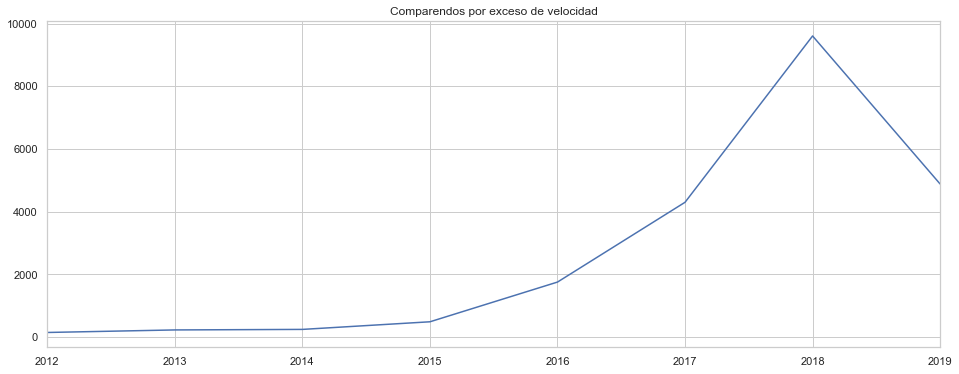

In [ ]:
df3[df3['DESCRIPCIÓN_INFRACCIÓN'].str.contains('velocidad')].iloc[:, 2:11].sum(
).plot(figsize=(16,6), title='Comparendos por exceso de velocidad');

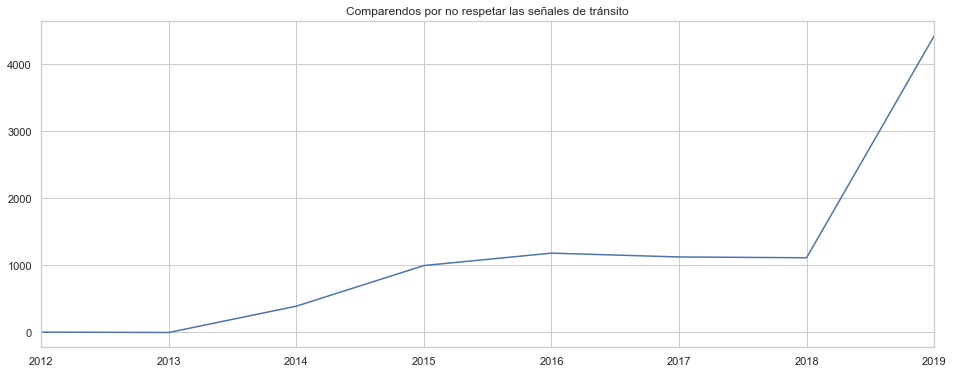

In [ ]:
df3[df3.index=='A05'].iloc[:, 2:11].sum(
).plot(figsize=(16,6), title='Comparendos por no respetar las señales de tránsito');

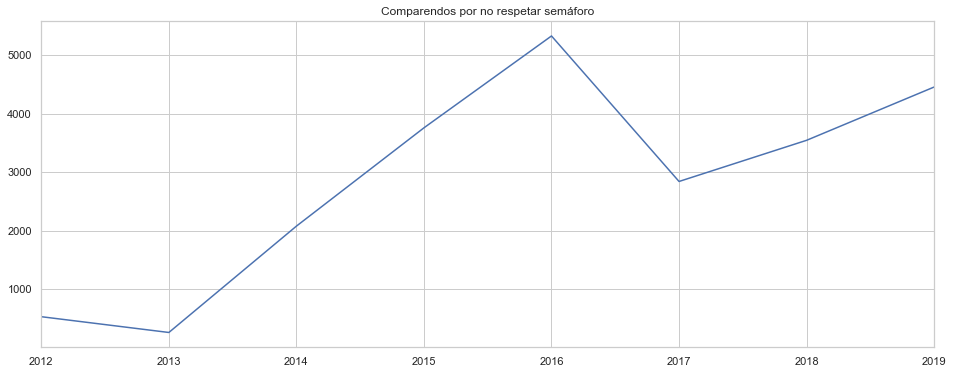

In [ ]:
df3[df3.index=='D04'].iloc[:, 2:11].sum(
).plot(figsize=(16,6), title='Comparendos por no respetar semáforo');

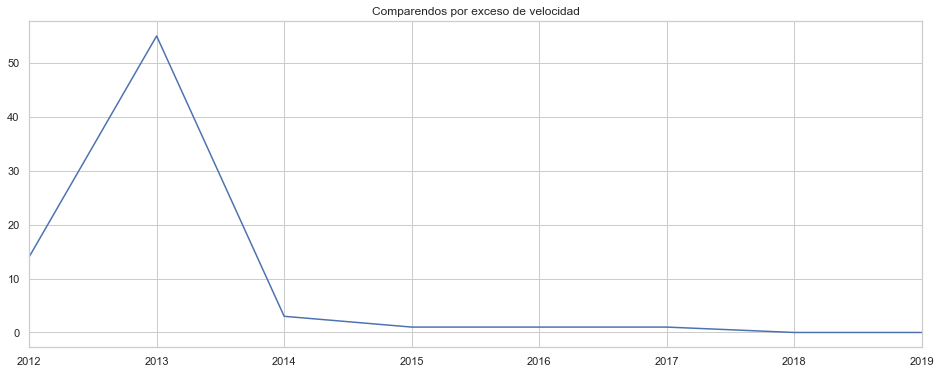

In [ ]:
df3[df3['DESCRIPCIÓN_INFRACCIÓN'].str.contains('embriaguez')].iloc[:, 2:11].sum(
).plot(figsize=(16,6), title='Comparendos por exceso de velocidad');

In [ ]:
siniestralidad_actor_vial = pd.read_excel(r'.\Data\Siniestros viales\2015_2019_siniestralidad_vial.xlsx','ACTOR_VIAL') 
df2 =siniestralidad_actor_vial.copy()

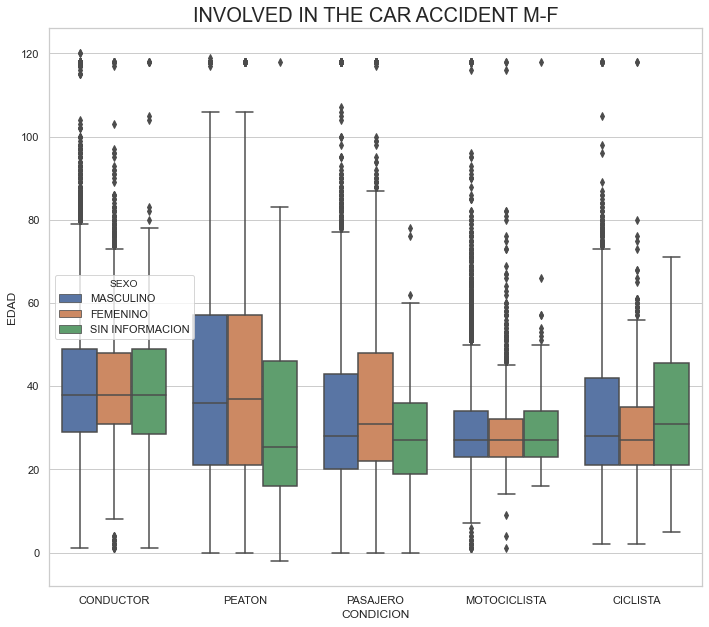

In [ ]:
sns.set_style("whitegrid")
sns.boxplot(x="CONDICION", hue="SEXO", y="EDAD", data=df2)
plt.title('INVOLVED IN THE CAR ACCIDENT M-F', fontsize=20);

**Comment :** This plot is a boxplot that contrasts age and involved per gender. The first thing that jumps out and that needs to be mentioned are the outliers, there is an important number at the top that shows an age of more than 116 years, an age that is unlikely to be so many drivers, motorcyclists or cyclists, it is also important to highlight the lower outliers in the driver and motorcycle categories, more analysis is needed to verify those ages below the legal age to drive, on the other hand, in injured people without gender information there is an age that should not be correct because it is a negative value, another case that must be investigated is that a good number of data does not have a gender identification, it is worth wondering if it is necessary to expand that category or delve into the reason.
It can be noted that the average age of the drivers is less than 40 years old even with the outliers with more than 116 years old, the interquartile range in pedestrians is wide affirming the variety of ages in this category, the average age of the motorcycle category is under 30 years old even with outliers over 116 years old, in the cycling category the number of men is greater than the number of women and the average age is less than 30 years


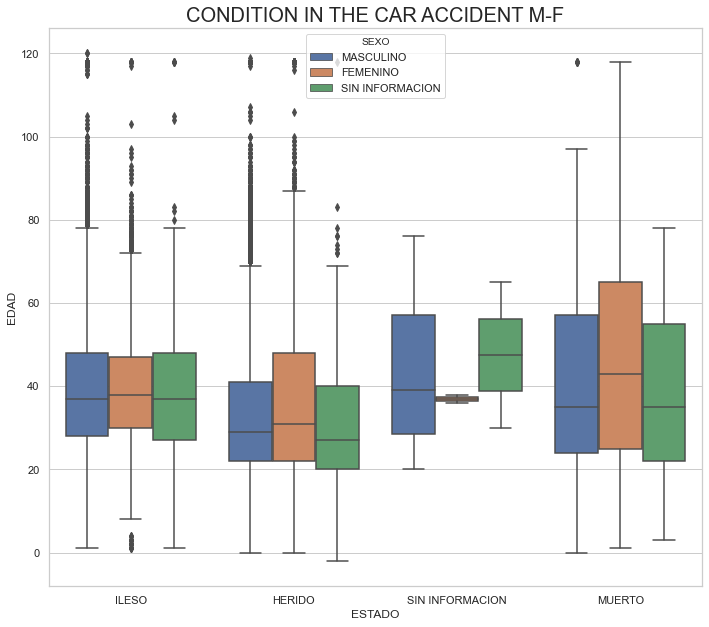

In [ ]:
sns.boxplot(x="ESTADO", y="EDAD", hue="SEXO", data=df2)
plt.title('CONDITION IN THE CAR ACCIDENT M-F', fontsize=20);

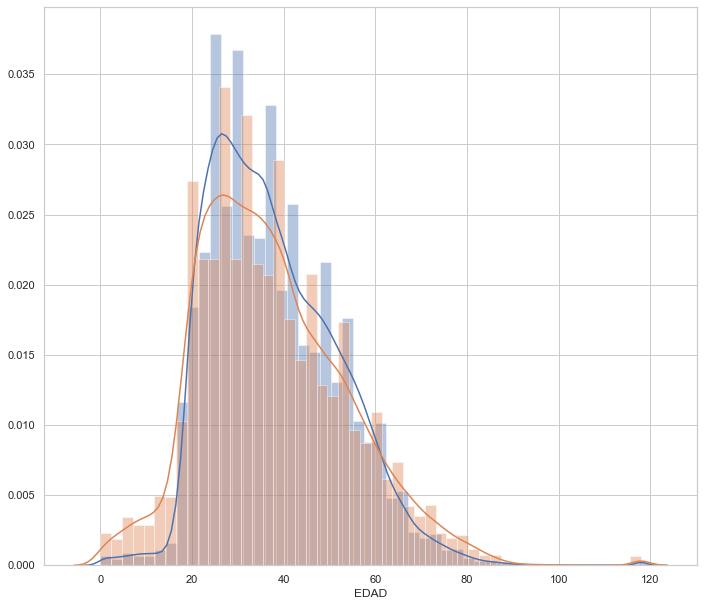

In [ ]:
sns.distplot(siniestralidad_actor_vial[siniestralidad_actor_vial['SEXO']=='MASCULINO']['EDAD'].dropna().astype(int))
sns.distplot(siniestralidad_actor_vial[siniestralidad_actor_vial['SEXO']=='FEMENINO']['EDAD'].dropna().astype(int));

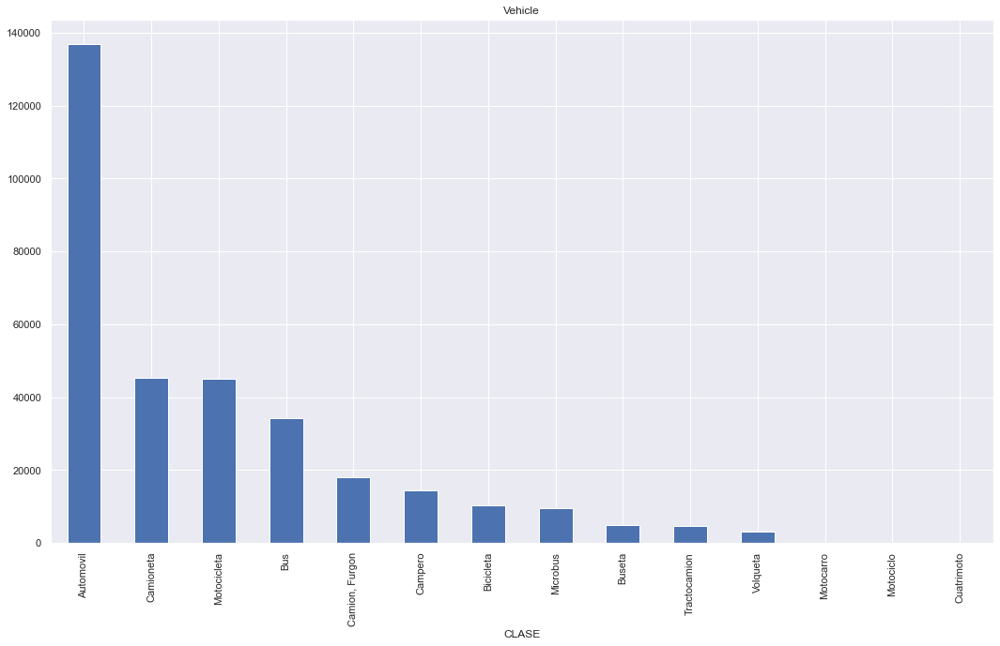

In [ ]:
vehiculo.groupby('CLASE')['CLASE'].count().sort_values(
    ascending=False).plot(kind='bar', title='Vehicle');

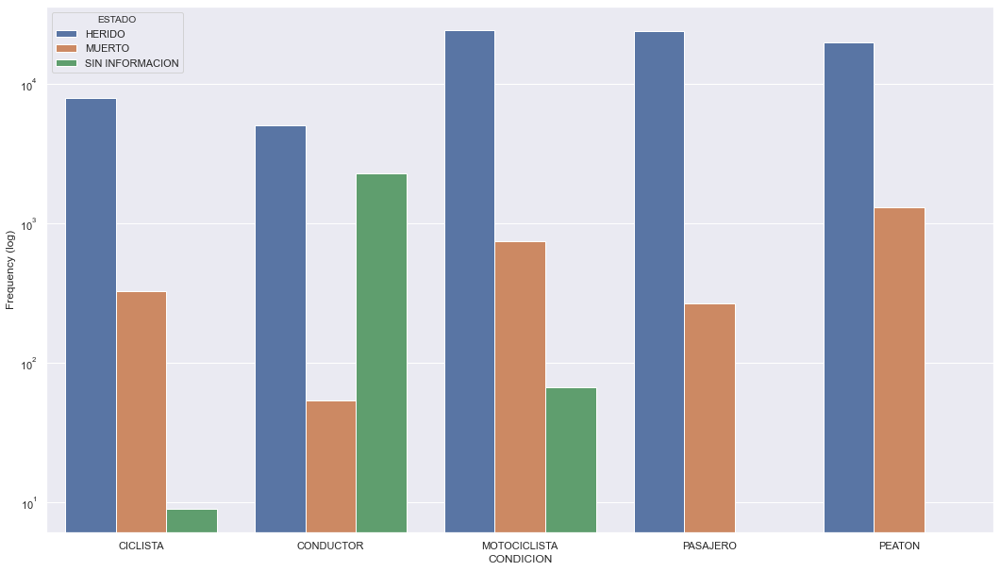

In [ ]:
gp = actor_vial[actor_vial['ESTADO']!='ILESO'].groupby((
    'CONDICION','ESTADO')).count().reset_index()
gp = pd.DataFrame(gp)
ax = sns.barplot(x='CONDICION', y='SEXO', hue='ESTADO', data=gp)
ax.set(yscale="log",  ylabel = "Frequency (log)");

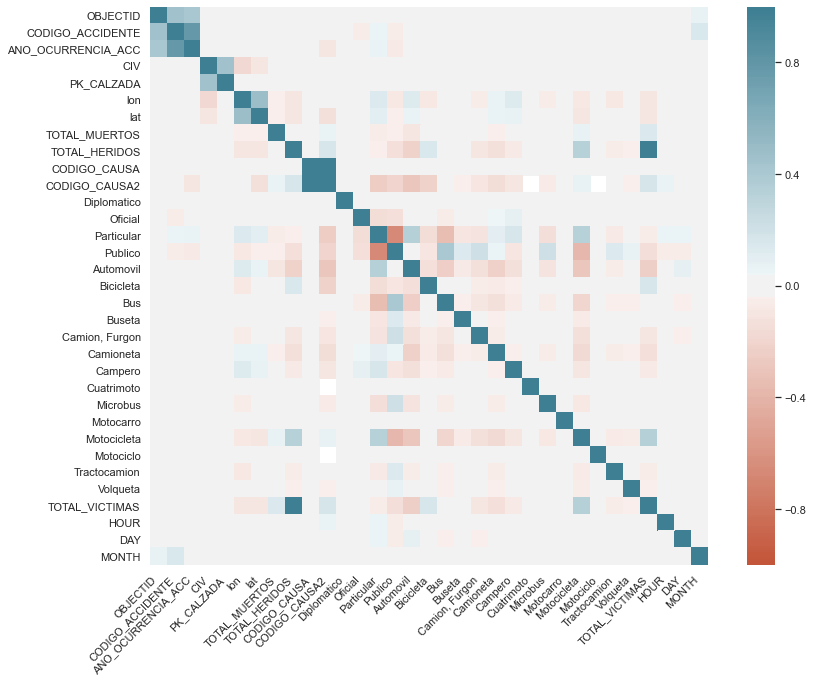

In [ ]:

corr = df.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [ ]:
df[df['Motocicleta']>=0]['TOTAL_VICTIMAS'].sum()

45188

In [ ]:
m = folium.Map(width=900, height=1200, location=[4.60971, -74.08175], zoom_start=12)

In [ ]:
HeatMap(data=df[['lat', 'lon', 'TOTAL_MUERTOS']].groupby(
    ['lat', 'lon']).sum(
).reset_index().values.tolist(), radius=8, max_zoom=13).add_to(m);

In [ ]:
m

In [ ]:
df.to_csv('siniestralidad_sin_actor_vial.csv')

In [ ]:
len(df)

189861

In [ ]:
m.save("fallecidos.html")

In [ ]:
m1 = folium.Map(width=900, height=1200, location=[4.60971, -74.08175], zoom_start=12)
HeatMap(data=df[['lat', 'lon', 'TOTAL_HERIDOS']].groupby(
    ['lat', 'lon']).sum(
).reset_index().values.tolist(), radius=8, max_zoom=13).add_to(m1);

In [ ]:
m1

In [ ]:
m1.save("heridos.html")

In [ ]:
#Sheijer Silva